# Projeto de Machine Learning sobre o dataset Wine Quality Red

### Referências
https://www.kaggle.com/datasets/uciml/red-wine-quality-cortez-et-al-2009
ou
https://archive.ics.uci.edu/ml/datasets/wine+quality

P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. Modeling wine preferences by data mining from physicochemical properties.

## Imports

In [34]:
# Imports
import pandas as pd
from ydata_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from collections import Counter
# from warnings import filterwarnings
# filterwarnings(action = 'ignore')

## Leitura do arquivo

In [19]:
# Lendo o dataset
wine_red = pd.read_csv("winequality-red.csv", sep = ";")

## Primeiras análises

In [20]:
# Cabeçalho
wine_red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
# Estatísticas
wine_red.describe()

In [ ]:
# Tipos das features
wine_red.dtypes

## Pandas profiling

In [23]:
# Overwiew estatístico do dataset
profile = ProfileReport(wine_red)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
# Remoção de duplicatas
wine_red = wine_red.drop_duplicates()
wine_red.shape

(1359, 12)

In [25]:
# Média das features por qualidade
wine_red.groupby('quality').mean()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
quality,,,,,,,,,,,
3,8.360000,0.884500,0.171000,2.635000,0.122500,11.000000,24.900000,0.997464,3.398000,0.570000,9.955000
4,7.779245,0.693962,0.174151,2.694340,0.090679,12.264151,36.245283,0.996542,3.381509,0.596415,10.265094
5,8.171231,0.578596,0.244523,2.509532,0.093971,17.161179,57.406412,0.997082,3.300815,0.623570,9.888562
6,8.337383,0.496084,0.279364,2.457290,0.085075,15.637383,40.816822,0.996565,3.318000,0.674542,10.658879
7,8.858683,0.403653,0.371856,2.716766,0.076832,13.994012,35.449102,0.996051,3.290060,0.742635,11.491118
8,8.441176,0.427647,0.382941,2.576471,0.068353,13.764706,34.470588,0.995095,3.274118,0.774706,12.158824


## Análise de dados

In [ ]:
sns.countplot(wine_red['quality'])
plt.show()
# Tentei plotar um gráfico com o código acima, mas não deu certo!
# Abaixo tentarei outra forma

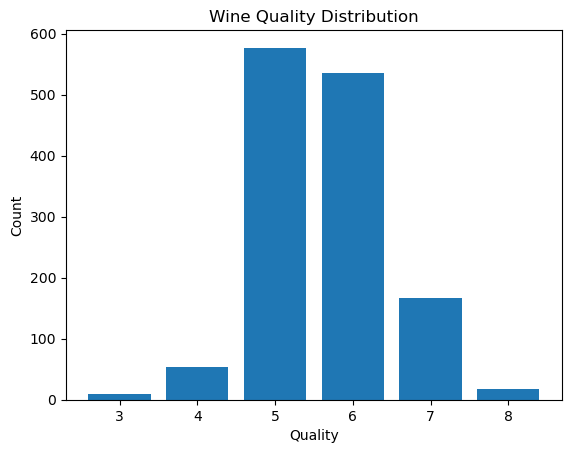

In [35]:
# Contar a quantidade de cada valor na coluna 'quality'
quality_counts = Counter(wine_red['quality'])

# Criar o gráfico com matplotlib
plt.bar(quality_counts.keys(), quality_counts.values())
plt.xlabel('Quality')
plt.ylabel('Count')
plt.title('Wine Quality Distribution')
plt.show()

### Observação!
Counter is an unordered collection where elements are stored as *Dict keys* and their count as *dict value*. Counter elements count can be positive, zero or negative integers. However there is no restriction on it’s keys and values. Although values are intended to be numbers but we can store other objects too.

De acordo com o descrito acima, ao plotar o gráfico, é necessário informar chave:valor, como descrito na linha de código 
**plt.bar(quality_counts.keys(), quality_counts.values())**

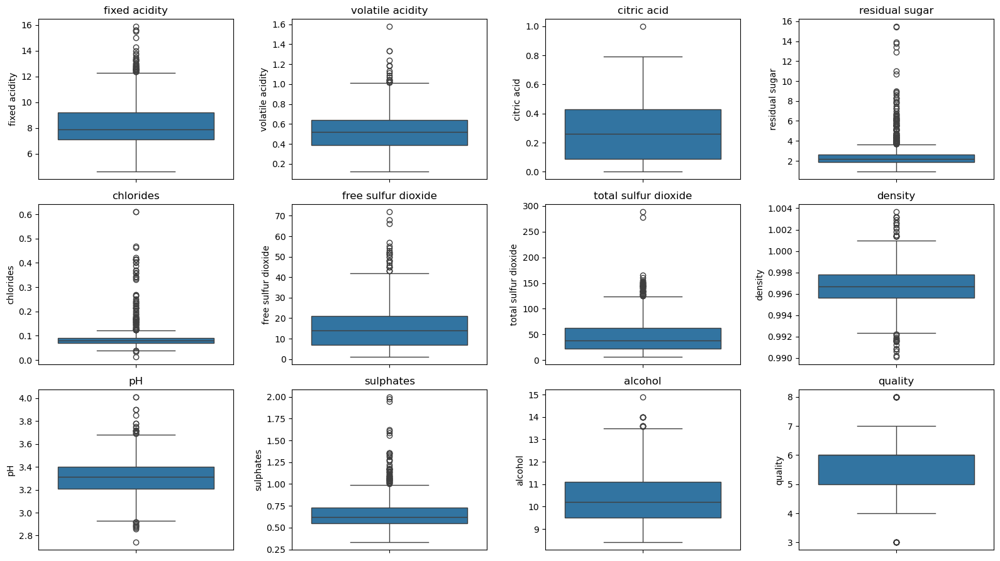

In [43]:
# criando visualizações box plot para cada feature numérica (que nesse caso, são todas)
plt.figure(figsize=(16, 9)) #Configura o tamanho do box plot

# Loop para cada uma das features
for i, column in enumerate(wine_red.select_dtypes(include = 'number').columns, 1):
    # Na linha acima, 'enumerate' está iterando sobre dois parâmetros, o 'wine_red.select_dtypes(include = "number").columns' e o '1'.
    # O primeiro parâmetro é o objeto no qual enumerate vai iterar, ou seja, as colunas numéricas. O segundo parâmetro é o índice, ou seja, inicia-se em 1.
    plt.subplot(3, 4, i) # Ajustável para a quantidade de features que eu estou trabalhando
    sns.boxplot(data = wine_red[column])
    plt.title(column)

plt.tight_layout()
plt.show()

<Axes: >

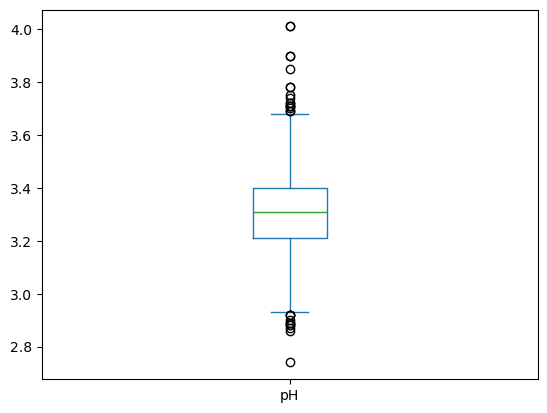

In [45]:
# Plotando um box plot de uma coluna específica
wine_red['pH'].plot(kind = 'box')

Nesse exemplo de boxplot do pH, percebemos algumas coisas, vamos lá! Primeiro, vemos alguns outliers, tanto acima do limite superior quanto abaixo do limite
inferior; a segunda observação é sobre o intervalo interquartílico, que é cerca de 0,2 com sua mediana ao centro, ou seja, a dispersão dos dados é homogênea
se comparado aos limites superior e inferior; e, por fim, é um boxplot simétrico, novamente mostrando uma dispersão homogênea dos dados

## Histograma

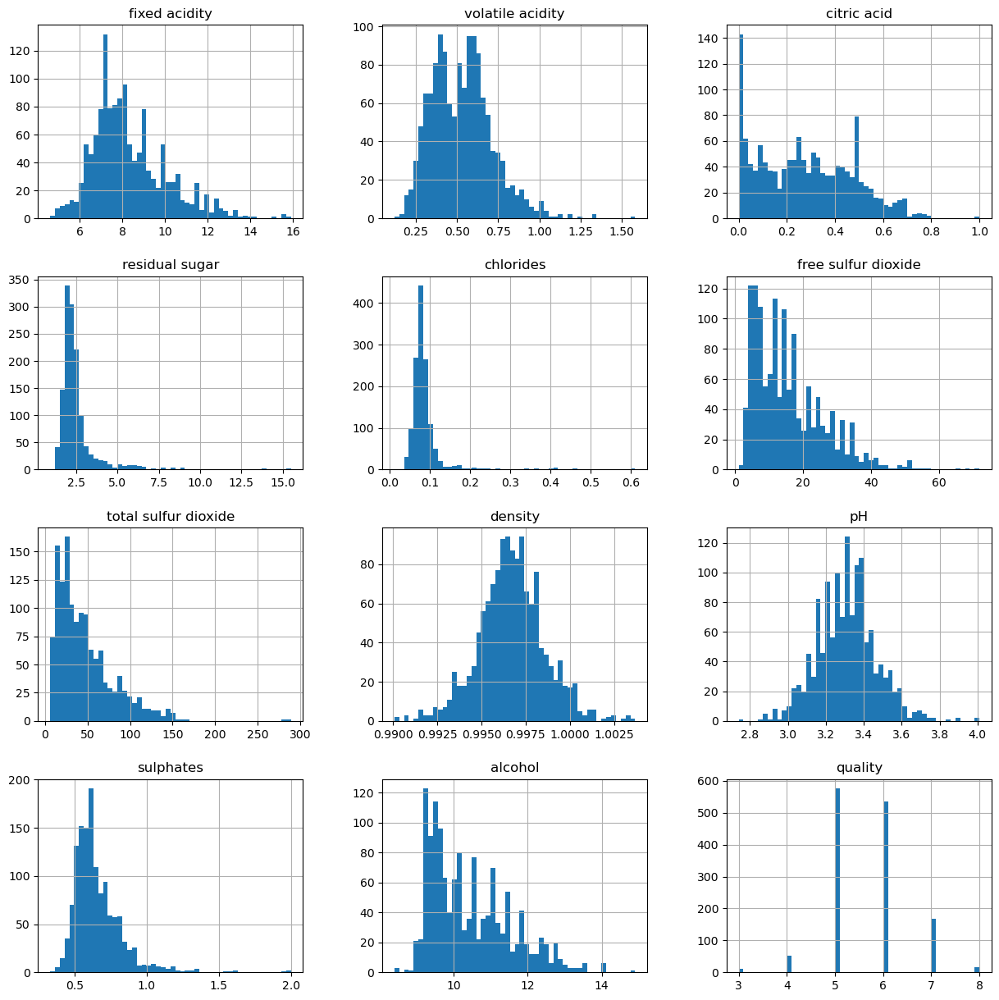

In [47]:
wine_red.hist(figsize = (15, 15), bins = 50)
plt.show()

Novamente, vamos observar o histograma do pH, é possível visualizar nele a distribuição homogênea dos dados, ou seja, é um histograma simétrico ou unimodal, corroborando com o boxplot visto anteriormente.

## Feature selection

In [50]:
# Se a qualidade do vinho é 7 ou superior, é considerado de boa qualidade, senão, de baixa qualidade
wine_red['goodquality'] = [1 if x >= 7 else 0 for x in wine_red['quality']]
wine_red.sample(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,goodquality
879,7.2,0.60,0.04,2.5,0.076,18.0,88.0,0.99745,3.53,0.55,9.5,5,0
411,9.1,0.45,0.35,2.4,0.080,23.0,78.0,0.99870,3.38,0.62,9.5,5,0
1127,6.3,0.76,0.00,2.9,0.072,26.0,52.0,0.99379,3.51,0.60,11.5,6,0
1494,6.4,0.31,0.09,1.4,0.066,15.0,28.0,0.99459,3.42,0.70,10.0,7,1
1543,11.1,0.44,0.42,2.2,0.064,14.0,19.0,0.99758,3.25,0.57,10.4,6,0


In [51]:
# Separação de variáveis dependentes e independentes
X = wine_red.drop(['quality', 'goodquality'], axis = 1) # drop remove as duas colunas ali indicadas, então X terá todas as outras colunas (features) 
                                                        # que serão usadas para prever a variável target. X contém as variáveis independentes
Y = wine_red['goodquality'] # Y armazena a variável que queremso prever (target). Y contém a variável dependente

In [54]:
# Contagem de vinhos de boa e má qualidade
wine_red['goodquality'].value_counts()

goodquality
0    1175
1     184
Name: count, dtype: int64

In [55]:
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [56]:
print(Y)

0       0
1       0
2       0
3       0
5       0
       ..
1593    0
1594    0
1595    0
1597    0
1598    0
Name: goodquality, Length: 1359, dtype: int64


In [57]:
# Import de ensemble para tentar aumentar a precisão do modelo
from sklearn.ensemble import ExtraTreesClassifier

clf = ExtraTreesClassifier() # Inicialização do classificador
clf.fit(X, Y) # Treinamento do modelo usando as features X e o target Y
score = clf.feature_importances_ # A propriedade 'feature_importances_' armazena um array com a importância relativa de cada feature, isso significa
                                 # que cada coluna terá sua importância armazenada. E quanto mais alto é x, maior a importância. Soma total é igual a 1.
print(score)

[0.07358204 0.10029329 0.09457624 0.07441883 0.07033765 0.07038288
 0.08271708 0.08700149 0.06658881 0.11274756 0.16735413]


## Divisão do dataset para treinamento

In [58]:
# Import de biblioteca
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 7)

## Resultado

In [120]:
# Criação de um df vazio com duas colunas para receber os resultados dos modelos de ML
df_resultado = pd.DataFrame(columns = ['Modelo', 'Score'])

## LogisticRegression

In [121]:
# import
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression() # Inicializa o modelo de Regressão Logística
lr.fit(X_train, y_train) # Treina o modelo com o conjunto de treino (X_train e y_train)
y_pred = lr.predict(X_test) # Faz previsões para o conjunto de teste

In [122]:
# Import
from sklearn.metrics import accuracy_score, confusion_matrix

df_resultado.loc[len(df_resultado)] = ['LogisticRegression', accuracy_score(y_test, y_pred)]
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706


## KNN

In [123]:
# Import
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors = 3)
knn_model.fit(X_train, y_train)
y_pred = knn_model.predict(X_test)

In [124]:
# Import
from sklearn.metrics import accuracy_score

df_resultado.loc[len(df_resultado)] = ['KNN', accuracy_score(y_test, y_pred)]
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706
1,KNN,0.867647


## SVC

In [125]:
# Import
from sklearn.svm import SVC

svc_model = SVC()
svc_model.fit(X_train, y_train)
y_pred = svc_model.predict(X_test)

In [126]:
df_resultado.loc[len(df_resultado)] = ['SVC', accuracy_score(y_test, y_pred)]
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706
1,KNN,0.867647
2,SVC,0.870098


In [86]:
# Import
from sklearn.naive_bayes import GaussianNB

gauss = GaussianNB()
gauss.fit(X_train, y_train)
y_pred = gauss.predict(X_test)

In [94]:
df_resultado.loc[len(df_resultado)] = ['GaussianNB', accuracy_score(y_test, y_pred)]
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706
1,KNN,0.867647
2,SVC,0.870098
4,GaussianNB,0.848039


## Random Forest

In [127]:
# Import
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

In [128]:
df_resultado.loc[len(df_resultado)] = ['RandomForestClassifier', accuracy_score(y_test, y_pred)]
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706
1,KNN,0.867647
2,SVC,0.870098
3,RandomForestClassifier,0.872549


## GaussianNB

In [129]:
from sklearn.naive_bayes import GaussianNB

gauss = GaussianNB()
gauss.fit(X_train, y_train)
y_pred = gauss.predict(X_test)

df_resultado.loc[len(df_resultado)] = ['GaussianNB', accuracy_score(y_test, y_pred)]
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706
1,KNN,0.867647
2,SVC,0.870098
3,RandomForestClassifier,0.872549
4,GaussianNB,0.848039


## Decision Tree

In [130]:
# Import
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
y_pred = dtc.predict(X_test)

df_resultado.loc[len(df_resultado)] = ['DecisionTreeClassifier', accuracy_score(y_test, y_pred)]
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706
1,KNN,0.867647
2,SVC,0.870098
3,RandomForestClassifier,0.872549
4,GaussianNB,0.848039
5,DecisionTreeClassifier,0.828431


## XgBoost

In [134]:
# Import
import xgboost as xgb

boost = xgb.XGBClassifier(random_state = 1)
boost.fit(X_train, y_train)
y_pred = boost.predict(X_test)

df_resultado.loc[len(df_resultado)] = ['XGBClassifier', accuracy_score(y_test, y_pred)]
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706
1,KNN,0.867647
2,SVC,0.870098
3,RandomForestClassifier,0.872549
4,GaussianNB,0.848039
5,DecisionTreeClassifier,0.828431
6,XGBClassifier,0.865196


In [135]:
df_resultado = df_resultado.sort_values(by = 'Score', ascending = False)

In [136]:
df_resultado

,Modelo,Score
0,LogisticRegression,0.889706
3,RandomForestClassifier,0.872549
2,SVC,0.870098
1,KNN,0.867647
6,XGBClassifier,0.865196
4,GaussianNB,0.848039
5,DecisionTreeClassifier,0.828431


### Por fim, verificamos que o **LogisticRegression** teve o melhor resultado de predição em relação aos outros. **DecisionTree** teve o resultado mais baixo.
### A média de acerto fica acima dos 80%, mas em outro momento é possível verificar se dá pra aumentar esse valor com a utilização de outras técnicas somadas aos algoritmos de treinamento.